In [2]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image
import os

In [3]:
model = YOLO("yolov8m.pt")

100%|█████████████████████████████████████████████████████████████████████████████| 49.7M/49.7M [00:01<00:00, 28.3MB/s]


In [6]:
path = 'images/'
images = os.listdir(path)


for img in range(len(images)):
  image = f'{path}{images[img]}'
  results = model.predict(image)
  result = results[0]

  img_detective = Image.fromarray(result.plot()[:,:,::-1])
  # Сохранение изображения
  img_detective.save(f'detective_images/image_{img+1}.jpg')

  # Доп информация об объектах на изображениях
  for box in result.boxes:
    class_id = result.names[box.cls[0].item()]
    cords = box.xyxy[0].tolist()
    cords = [round(x) for x in cords]
    conf = round(box.conf[0].item(), 2)
    print("---")
    print("Object type:", class_id)
    print("Coordinates:", cords)
    print("Probability:", conf)
    print("Speed:", result.speed)
  print("--------------------------------------------")


image 1/1 C:\Users\vboro\OneDrive\Desktop\git_folders\TMSds\lesson35\images\image1.jpg: 640x544 1 person, 1 car, 791.6ms
Speed: 2.0ms preprocess, 791.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 544)
---
Object type: person
Coordinates: [278, 458, 399, 770]
Probability: 0.9
Speed: {'preprocess': 2.0346641540527344, 'inference': 791.5692329406738, 'postprocess': 0.0}
---
Object type: car
Coordinates: [393, 297, 735, 909]
Probability: 0.42
Speed: {'preprocess': 2.0346641540527344, 'inference': 791.5692329406738, 'postprocess': 0.0}
--------------------------------------------

image 1/1 C:\Users\vboro\OneDrive\Desktop\git_folders\TMSds\lesson35\images\image2.jpg: 640x544 1 person, 766.2ms
Speed: 0.7ms preprocess, 766.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 544)
---
Object type: person
Coordinates: [284, 425, 344, 544]
Probability: 0.88
Speed: {'preprocess': 0.7357597351074219, 'inference': 766.181230545044, 'postprocess': 2.5243759155273438}
--

image 1/1 C:\Users\vboro\OneDrive\Desktop\git_folders\TMSds\lesson35\images\image7.jpg: 640x448 4 cups, 1 fork, 1 cake, 1 dining table, 636.5ms
Speed: 1.1ms preprocess, 636.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 448)
---
Object type: cup
Coordinates: [117, 506, 181, 589]
Probability: 0.92
Speed: {'preprocess': 1.068115234375, 'inference': 636.5065574645996, 'postprocess': 0.0}
---
Object type: cup
Coordinates: [186, 438, 236, 499]
Probability: 0.9
Speed: {'preprocess': 1.068115234375, 'inference': 636.5065574645996, 'postprocess': 0.0}
---
Object type: cup
Coordinates: [350, 494, 412, 569]
Probability: 0.89
Speed: {'preprocess': 1.068115234375, 'inference': 636.5065574645996, 'postprocess': 0.0}
---
Object type: cup
Coordinates: [243, 436, 292, 501]
Probability: 0.88
Speed: {'preprocess': 1.068115234375, 'inference': 636.5065574645996, 'postprocess': 0.0}
---
Object type: dining table
Coordinates: [29, 476, 450, 710]
Probability: 0.63
Speed: {'preprocess': 1.06

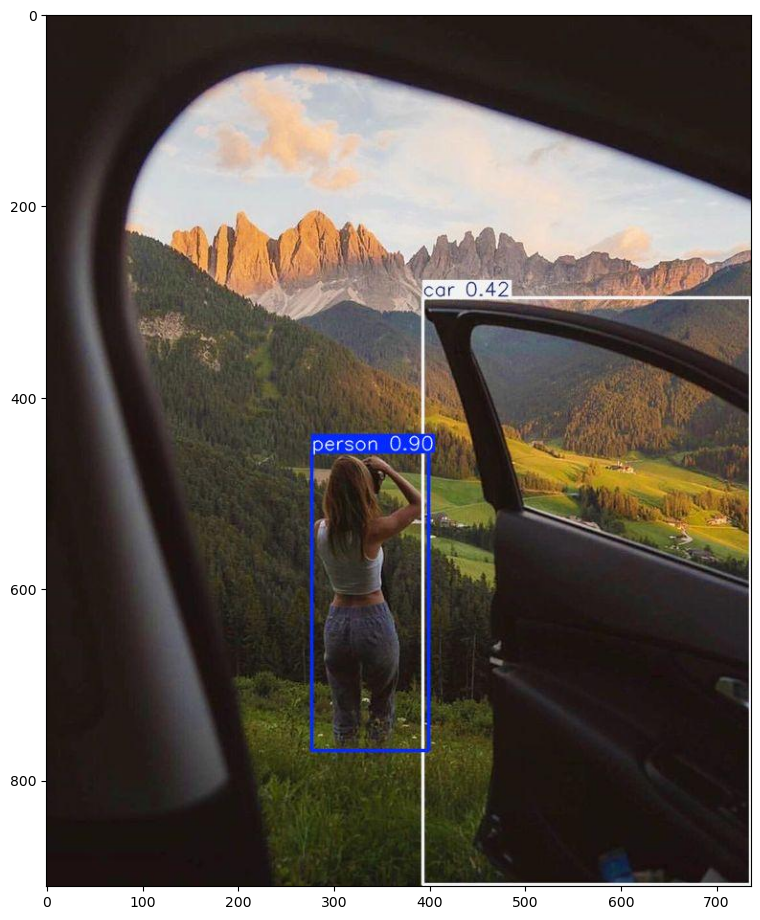

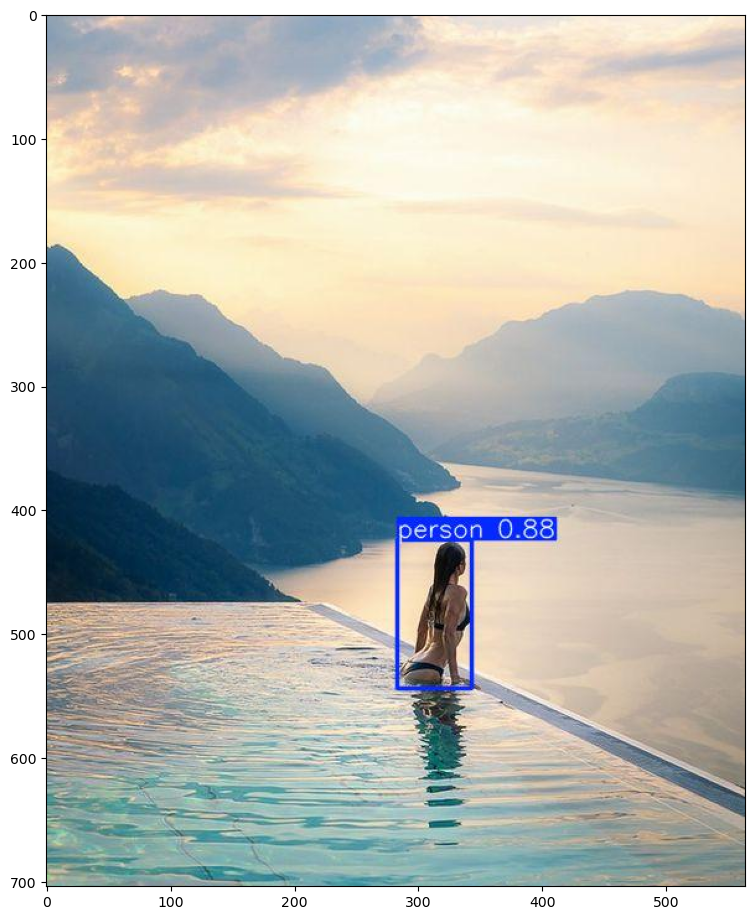

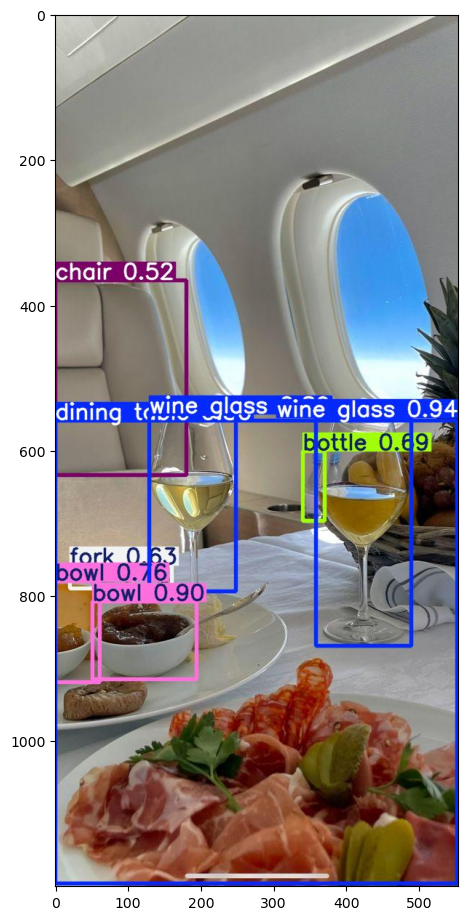

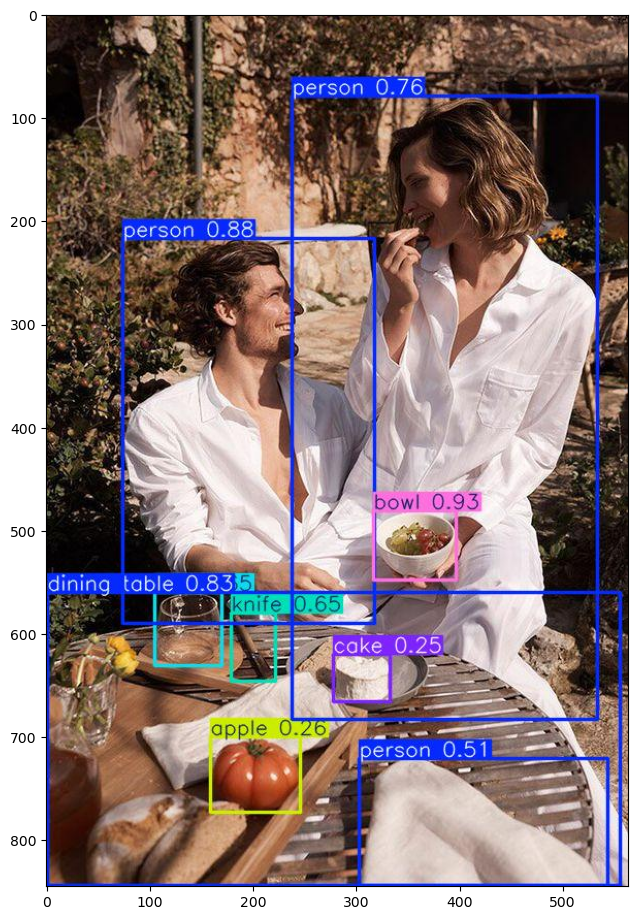

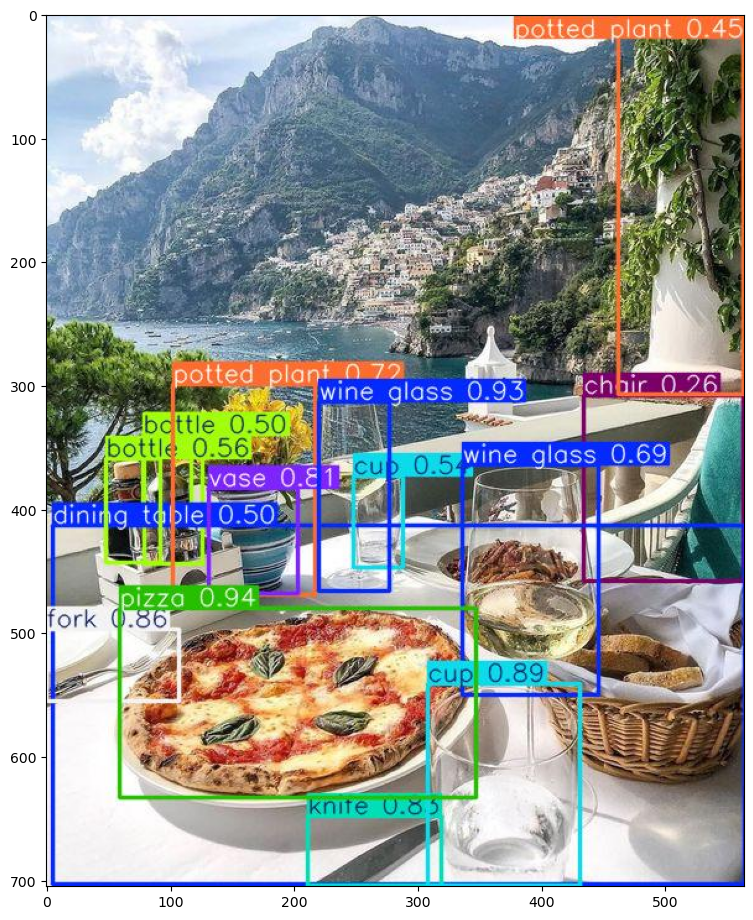

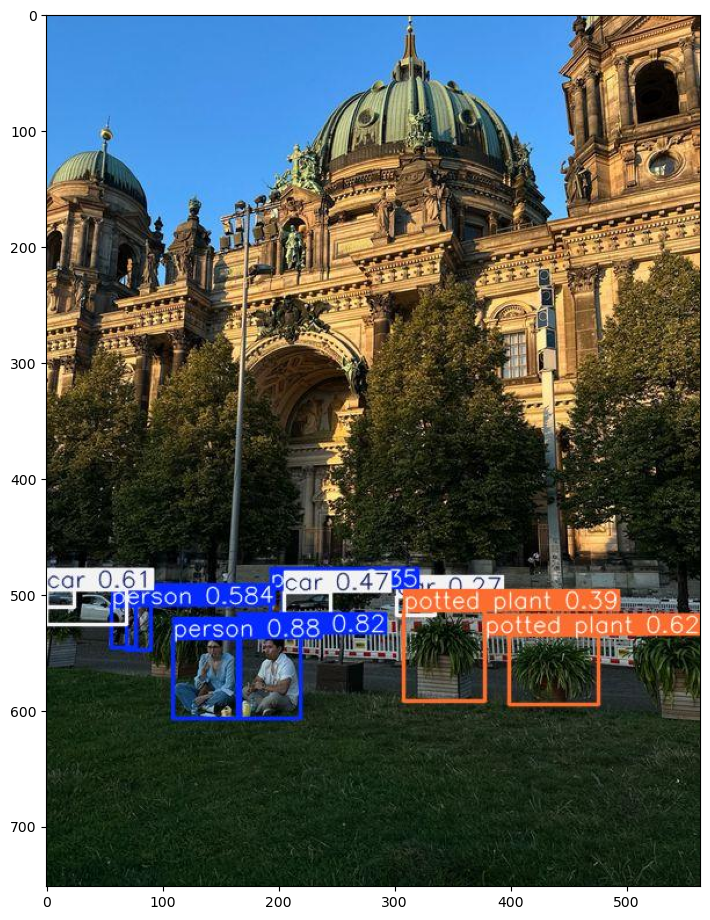

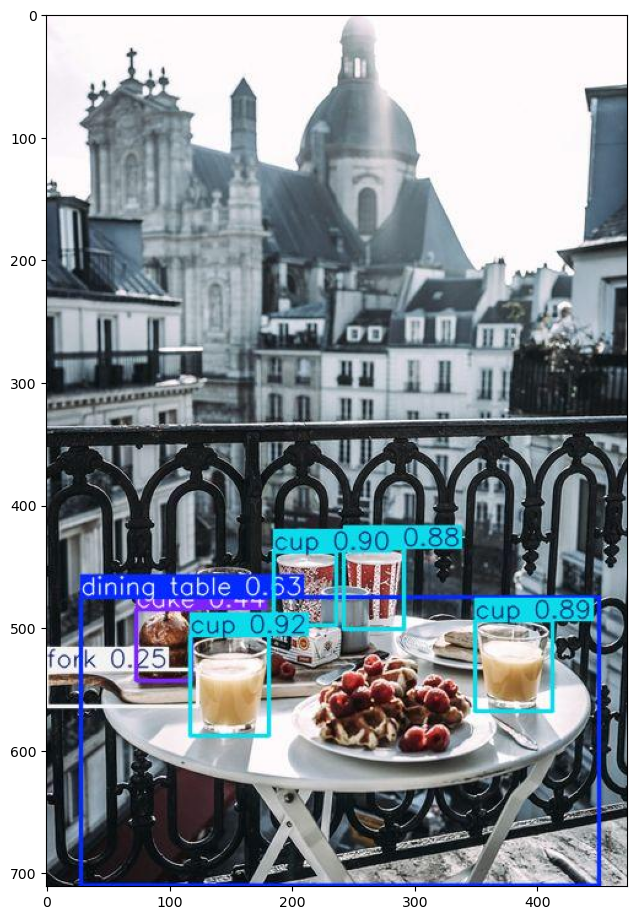

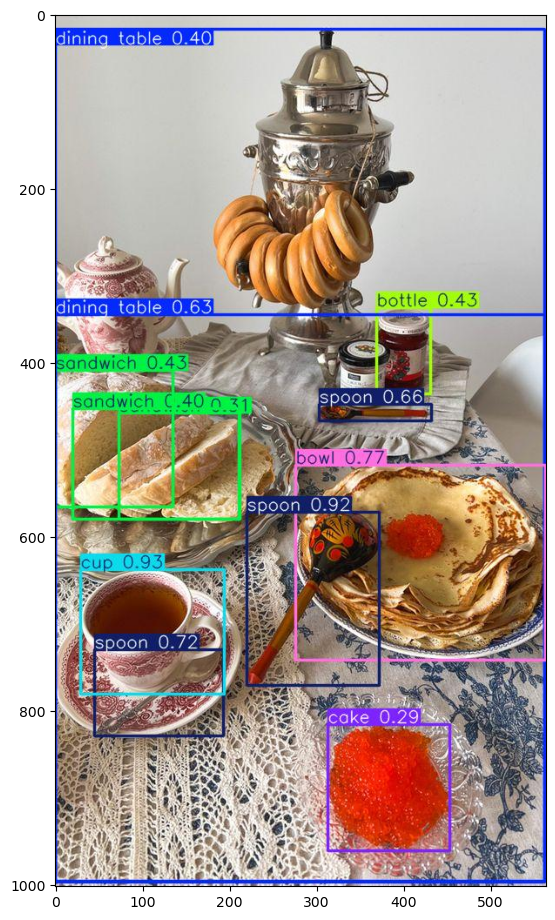

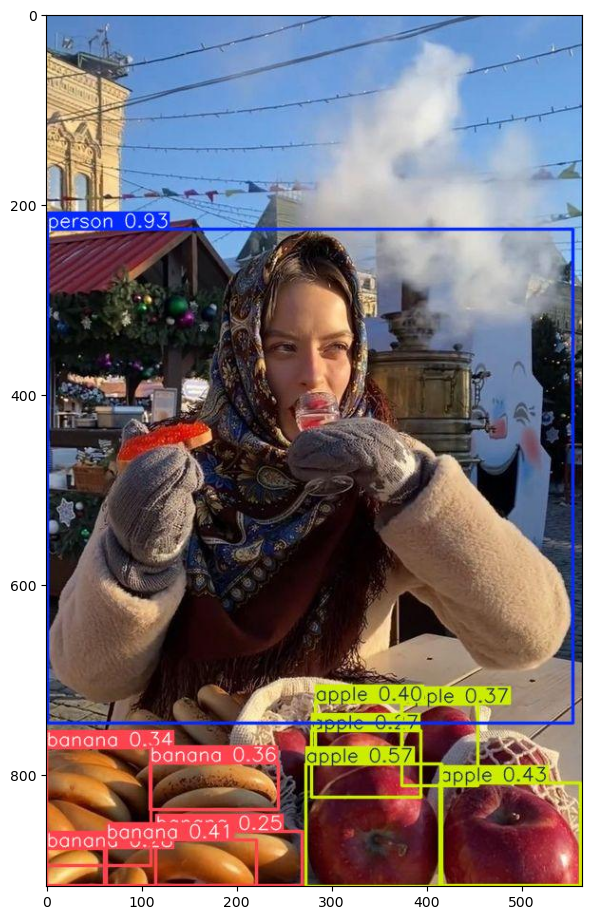

In [7]:
path = 'detective_images/'
files = os.listdir(path)

for idx, img in enumerate(files):
  image = Image.open(f'{path}{img}')
  plt.figure(figsize=(60,120))
  plt.subplot(len(files), 1, 1)
  plt.imshow(image)
plt.show()